#**HongKong AirBnB**



The data is sourced from the Inside Airbnb website http://insideairbnb.com/get-the-data.html which hosts publicly available data from the Airbnb site.
The dataset comprises of 2 main tables:

- Detailed listings data.

- Detailed reviews

Our target audience we toward to are: 
- Tourists, guests who want to visit Hong Kong, who want to rent Airbnb at the 3 centre, most popular locations.

There are 4 main questions we aim to answer through our analysis:
- Advantages an disadvantages of the different type of listings
- Factors that tourists should look out for when booking AirBnB, in terms of hosts
- What are the price range of the 3 location, are there any relationship between the price and rating, room type or room facilities
- What is the main rating score for each of the top 3 locations? What and how every rating criterion performs itself in the dataset? How is the comparison among the top 3?

# MOUNT & IMPORT

In [77]:
from google.colab import drive
drive.mount('/content/gdrive')  #to connect with a google drive that we have in the system

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import gzip
import seaborn as sns
import matplotlib.pyplot as plt
import folium

# Read Files

In [105]:
  #Read file Neighbourhood
#neighbour_csv = pd.read_csv('')

#Read file Neigbourhoods.geojson:

  #Read file Listing
#listing_csv = pd.read_csv('')

with gzip.open('/content/gdrive/MyDrive/Hong_Kong_AirBnB/listings.csv.gz') as f:
		listing_gz = pd.read_csv(f)
  
  #Read file Review
#review_csv = pd.read_csv('')

with gzip.open('/content/gdrive/MyDrive/Hong_Kong_AirBnB/reviews.csv.gz') as f:
    review_gz = pd.read_csv(f)

  #Read file Calendar
#with gzip.open('') as f:
    #calendar_gz = pd.read_csv(f)

In [81]:
listing_gz.head(3)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,69074,https://www.airbnb.com/rooms/69074,20210713201928,2021-07-14,Beautiful oasis of plants & art @ best location,An ideal Hong location any visitor--hip withou...,"In the upper part of trendy, hip Sheung Wan, w...",https://a0.muscache.com/pictures/84364564/1e0c...,160139,https://www.airbnb.com/users/show/160139,Amy,2010-07-07,Hong Kong,"I've been with AirBnB now for many years, ofte...",within an hour,89%,50%,f,https://a0.muscache.com/im/users/160139/profil...,https://a0.muscache.com/im/users/160139/profil...,Sheung Wan,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Sheung Wan, Hong Kong",Central & Western,NaN,22.28350,114.14854,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""First aid kit"", ""Hai...","$1,309.00",7,365,7,14,365,365,8.0,365.0,NaN,t,6,36,66,156,2021-07-14,134,0,0,2012-06-29,2019-08-03,4.83,4.81,4.77,4.86,4.91,4.90,4.69,NaN,f,1,1,0,0,1.22
1,75083,https://www.airbnb.com/rooms/75083,20210713201928,2021-07-13,SoHo off Hollywood Road 3B,"Located steps from Hollywood road, with new ea...",NaN,https://a0.muscache.com/pictures/2873745/90c15...,304876,https://www.airbnb.com/users/show/304876,Brend,2010-11-30,Hong Kong,I was born in California and raised in Hong Ko...,within a few hours,100%,92%,f,https://a0.muscache.com/im/users/304876/profil...,https://a0.muscache.com/im/users/304876/profil...,Sheung Wan,12.0,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,NaN,Central & Western,NaN,22.28401,114.15058,Entire apartment,Entire home/apt,3,NaN,1 bath,NaN,2.0,"[""Lockbox"", ""TV with standard cable"", ""Dedicat...",$404.00,14,365,14,14,365,365,14.0,365.0,NaN,t,0,0,0,129,2021-07-13,229,0,0,2013-04-26,2017-03-31,4.43,4.32,4.63,4.35,4.46,4.69,4.39,NaN,f,14,10,4,0,2.29
2,103760,https://www.airbnb.com/rooms/103760,20210713201928,2021-07-13,Central Centre 5 min walk to/from Central MTR,"Located right in the heart of Central, this 2 ...",NaN,https://a0.muscache.com/pictures/815221/056993...,304876,https://www.airbnb.com/users/show/304876,Brend,2010-11-30,Hong Kong,I was born in California and raised in Hong Ko...,within a few hours,100%,92%,f,https://a0.muscache.com/im/users/304876/profil...,https://a0.muscache.com/im/users/304876/profil...,Sheung Wan,12.0,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,NaN,Central & Western,NaN,22.28418,114.15431,Entire apartment,Entire home/apt,6,NaN,1 bath,2.0,3.0,"[""Lockbox"", ""TV with standard cable"", ""Wifi"", ...",$700.00,2,365,2,2,365,365,2.0,365.0,NaN,t,26,56,86,156,2021-07-13,272,0,0,2014-06-04,2019-11-17,4.44,4.39,4.44,4.46,4.60,4.72,4.40,NaN,f,14,10,4,0,3.14


In [ ]:
review_gz.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,69074,181973,2011-02-14,358597,Chi Yan,Lovely apartment in a great location that quic...
1,69074,252237,2011-05-05,467243,Doreen,"As a former resident of HK, I can say that Amy..."
2,69074,400484,2011-07-27,696753,Michael,I stayed in this Apt for about 12 days. Such a...
3,69074,411022,2011-08-01,40901,Donna,"Amy's cute, comfortable apartment is in the he..."
4,69074,497498,2011-09-03,341618,Melissa,Amy was the perfect host - extremely communica...


# CLEANING DATA

##**STEP 1: REMOVE UNWANTED DATA**



In [106]:
#DROP UNECESSARY COLUMS
columns = ['scrape_id','last_scraped', 'description','picture_url','host_url',
           'host_location','host_about','host_picture_url','host_thumbnail_url',
           'neighbourhood','neighbourhood_group_cleansed', 'neighborhood_overview',
           'property_type', 'bathrooms',
           'minimum_minimum_nights', 'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm',
           'calendar_updated','calendar_last_scraped',
           'number_of_reviews_ltm','number_of_reviews_l30d',
           'license','host_listings_count','host_neighbourhood','first_review','last_review']

listing_gz = listing_gz.drop(columns= columns)

In [ ]:
# TOP 3 NEIGHBOURHOODS WITH MOST LISTINGS
listing_gz['neighbourhood_cleansed'].value_counts().head(3)

Yau Tsim Mong        2706
Wan Chai             1420
Central & Western     971
Name: neighbourhood_cleansed, dtype: int64

In [107]:
# FILTER OUT 3 CENTRAL LOCATIONS WITH MOST LISTINGS
listing_gz =  listing_gz[listing_gz['neighbourhood_cleansed'].isin(['Yau Tsim Mong','Wan Chai','Central & Western'])]

In [92]:
def draw_map(data):

    # Assign colors
    colors = {'Yau Tsim Mong':'red', 'Wan Chai' : 'blue', 'Central & Western': 'yellow'} #22.296524032148113, 114.16951206388765

    # draw map with lat long from google map
    map = folium.Map(location=[22.2965, 114.1695], zoom_start=13)

    # apply folium to selection (with color)
    data.apply(lambda row:folium.Circle(location=[row["latitude"], row["longitude"]], 
                                                  radius=5, color=colors[row['neighbourhood_cleansed']], 
                                                  fill=True, fill_color=colors[row['neighbourhood_cleansed']],
                                                  popup=row['listing_url'])
                                                  .add_to(map), axis=1)

    return map

In [ ]:
draw_map(listing_gz)

Output hidden; open in https://colab.research.google.com to view.

##**STEP 2: CHANGING DATATYPE AND DEALING WITH MISSING DATA**

> 




### Host

In [87]:
#check info
listing_gz.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5097 entries, 0 to 6537
Data columns (total 45 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            5097 non-null   int64  
 1   listing_url                                   5097 non-null   object 
 2   name                                          5096 non-null   object 
 3   host_id                                       5097 non-null   int64  
 4   host_name                                     5083 non-null   object 
 5   host_since                                    5083 non-null   object 
 6   host_response_time                            4006 non-null   object 
 7   host_response_rate                            4006 non-null   float64
 8   host_acceptance_rate                          3713 non-null   float64
 9   host_is_superhost                             5083 non-null   o

**Change Datatype**

In [108]:
# host_response_rate:
listing_gz['host_response_rate'] = listing_gz['host_response_rate'].str.replace('%','').astype('float')

# host_acceptance_rate:
listing_gz['host_acceptance_rate'] = listing_gz['host_acceptance_rate'].str.replace('%','').astype('float')


In [94]:
# Check null data:
listing_gz.isna().sum()

id                                                 0
listing_url                                        0
name                                               1
host_id                                            0
host_name                                         14
host_since                                        14
host_response_time                              1091
host_response_rate                              1091
host_acceptance_rate                            1384
host_is_superhost                                 14
host_total_listings_count                         14
host_verifications                                 0
host_has_profile_pic                              14
host_identity_verified                            14
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
room_type                                          0
accommodates                                  

**Work with missing data**

In [109]:
### Host_response_rate:
  #superhost_t:
mask_t = (listing_gz['host_is_superhost'] == 't')

superhost_t = listing_gz[mask_t & (listing_gz['host_response_rate'].notna())]
superhost_t_mean = superhost_t['host_response_rate'].mean()

listing_gz.loc[mask_t,'host_response_rate'] = listing_gz.loc[mask_t,'host_response_rate'].fillna(superhost_t_mean)

  #superhost_f:
mask_f = (listing_gz['host_is_superhost'] == 'f')

superhost_f = listing_gz[mask_f & (listing_gz['host_response_time'].notna())]
superhost_f_mean = superhost_f['host_response_rate'].mean()

listing_gz.loc[mask_f,'host_response_rate'] = listing_gz.loc[mask_f,'host_response_rate'].fillna(superhost_f_mean)


In [110]:
listing_gz.groupby('host_is_superhost')['host_response_rate'].mean().reset_index()

,host_is_superhost,host_response_rate
0,f,81.341035
1,t,98.448017


In [111]:
listing_gz.groupby('host_response_time')['host_response_rate'].describe()

,count,mean,std,min,25%,50%,75%,max
host_response_time,,,,,,,,
a few days or more,428.0,5.035047,11.776060,0.0,0.0,0.0,0.0,50.0
within a day,384.0,78.976562,19.451942,50.0,63.0,80.0,100.0,100.0
within a few hours,1613.0,95.603224,8.931989,67.0,95.0,100.0,100.0,100.0
within an hour,1581.0,98.117015,5.698509,61.0,100.0,100.0,100.0,100.0


In [112]:
### Host_response_time:
  #superhost_t:
listing_gz.loc[mask_t,'host_response_time'] = listing_gz.loc[mask_t,'host_response_time'].fillna('within an hour')

  #superhost_f:
listing_gz.loc[mask_f,'host_response_time'] = listing_gz.loc[mask_f,'host_response_time'].fillna('within a day')

In [113]:
### Host_acceptance_rate:
  # with reviews:
review_t = (listing_gz['reviews_per_month'].notna())
review_t_mean = listing_gz[review_t]['host_acceptance_rate'].mean()
listing_gz.loc[review_t,'host_acceptance_rate'] = listing_gz.loc[review_t,'host_acceptance_rate'].fillna(review_t_mean)

  # no reviews
review_f = (listing_gz['reviews_per_month'].isna())
review_f_mean = listing_gz[review_f]['host_acceptance_rate'].mean()
listing_gz.loc[review_f,'host_acceptance_rate'] = listing_gz.loc[review_f,'host_acceptance_rate'].fillna(review_f_mean)

In [100]:
# Check again:
listing_gz.isna().sum()

id                                                 0
listing_url                                        0
name                                               1
host_id                                            0
host_name                                         14
host_since                                        14
host_response_time                                14
host_response_rate                                14
host_acceptance_rate                               0
host_is_superhost                                 14
host_total_listings_count                         14
host_verifications                                 0
host_has_profile_pic                              14
host_identity_verified                            14
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
room_type                                          0
accommodates                                  

**Remove remaining NaN data**

In [114]:
# Filter out the remaining rows with Null data (only 0.27% of total dataframe)
listing_gz = listing_gz[listing_gz['host_since'].notna()]

In [115]:
# Fill in 'Unknown' for 1 missing listing name
listing_gz['name'] = listing_gz['name'].fillna('Unknown')

In [116]:
#check Null again
listing_gz.isna().sum()

id                                                 0
listing_url                                        0
name                                               0
host_id                                            0
host_name                                          0
host_since                                         0
host_response_time                                 0
host_response_rate                                 0
host_acceptance_rate                               0
host_is_superhost                                  0
host_total_listings_count                          0
host_verifications                                 0
host_has_profile_pic                               0
host_identity_verified                             0
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
room_type                                          0
accommodates                                  

### Property

In [ ]:
#check the relation between number of bedrooms and room_type: 
listing_gz.groupby(['bedrooms','room_type'])['id'].count()
#>>> shared_room:1 , hotel_room and private_room:1 , entire_home/apt: 2

bedrooms  room_type      
1.0       Entire home/apt     627
          Hotel room          134
          Private room       2537
          Shared room         288
2.0       Entire home/apt     299
          Hotel room            2
          Private room         38
3.0       Entire home/apt     103
          Hotel room            1
          Private room          9
4.0       Entire home/apt      40
          Private room          6
5.0       Entire home/apt       3
          Private room          8
6.0       Private room          3
7.0       Entire home/apt       1
          Private room          4
8.0       Entire home/apt       1
          Private room          1
9.0       Private room          8
10.0      Private room          5
11.0      Private room          2
14.0      Private room          1
Name: id, dtype: int64

In [ ]:
listing_gz.isna().sum()

id                                                 0
listing_url                                        0
name                                               0
host_id                                            0
host_name                                          0
host_since                                         0
host_response_time                                 0
host_response_rate                                 0
host_acceptance_rate                               0
host_is_superhost                                  0
host_total_listings_count                          0
host_verifications                                 0
host_has_profile_pic                               0
host_identity_verified                             0
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
room_type                                          0
accommodates                                  

In [ ]:
# we use apply:
def check_room_type(x):
  if x['room_type'] == 'Entire home/apt':
      return  2.0
  elif x['room_type'] == 'Shared room':
      return  1.0
  else:
      return  1.0
# fill the missing value with the apply function:
listing_gz['bedrooms']= listing_gz['bedrooms'].fillna(listing_gz.apply(check_room_type,axis=1))   

#similarly, we do the same with beds column:
listing_gz['beds']= listing_gz['beds'].fillna(listing_gz.apply(check_room_type,axis=1))   
# change beds and bedrooms to int 
listing_gz['bedrooms']= listing_gz['bedrooms'].astype('int')
listing_gz['beds']= listing_gz['beds'].astype('int')


In [ ]:
# fill 20 missing value of bathrooms_text with 1
listing_gz['bathrooms_text'] = listing_gz['bathrooms_text'].fillna('1')
# step 2: takes the "number " out the the strings of the column
listing_gz['bathrooms_text'] = listing_gz['bathrooms_text'].str.replace(r'[a-zA-Z\s]', '')
# replace the '' values to 1:
listing_gz['bathrooms_text'] = listing_gz['bathrooms_text'].str.replace(r'\D$','1')
# turn the type to float
listing_gz['bathrooms_text'] = listing_gz['bathrooms_text'].astype('float')
# change the name to barthrooms
listing_gz.rename(columns = {'bathrooms_text':'bathrooms'}, inplace = True)

In [ ]:
# check the columns again:
listing_gz.isna().sum()
# now we only have review sectors

id                                                 0
listing_url                                        0
name                                               0
host_id                                            0
host_name                                          0
host_since                                         0
host_response_time                                 0
host_response_rate                                 0
host_acceptance_rate                               0
host_is_superhost                                  0
host_total_listings_count                          0
host_verifications                                 0
host_has_profile_pic                               0
host_identity_verified                             0
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
room_type                                          0
accommodates                                  

### Price

In [ ]:
#remove $ sign from the price column and change it to float type
listing_gz['price'] = listing_gz['price'].str.replace(r'[$,]', '').astype('float')

In [ ]:
listing_gz['Price_Accomodate'] = listing_gz["price"]/listing_gz["accommodates"]
listing_gz["Price_Accomodate"]

Q1 = listing_gz["Price_Accomodate"].quantile(0.25)
Q3 = listing_gz["Price_Accomodate"].quantile(0.75)

IQR = Q3 - Q1

UW = Q3 + 1.5*IQR
LW = Q1 - 1.5*IQR

clean_price = listing_gz[(listing_gz['Price_Accomodate']  < UW) & (listing_gz['Price_Accomodate']  > LW)]

clean_price.head()

,id,listing_url,name,host_id,host_name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,Price_Accomodate
0,69074,https://www.airbnb.com/rooms/69074,Beautiful oasis of plants & art @ best location,160139,Amy,2010-07-07,within an hour,89.0,50.0,f,2.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,Central & Western,22.28350,114.14854,Entire home/apt,3,1.0,1,2,"[""Dryer"", ""Smoke alarm"", ""First aid kit"", ""Hai...",1309.0,7,365,t,6,36,66,156,134,4.83,4.81,4.77,4.86,4.91,4.90,4.69,f,1,1,0,0,1.22,436.333333
1,75083,https://www.airbnb.com/rooms/75083,SoHo off Hollywood Road 3B,304876,Brend,2010-11-30,within a few hours,100.0,92.0,f,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,Central & Western,22.28401,114.15058,Entire home/apt,3,1.0,2,2,"[""Lockbox"", ""TV with standard cable"", ""Dedicat...",404.0,14,365,t,0,0,0,129,229,4.43,4.32,4.63,4.35,4.46,4.69,4.39,f,14,10,4,0,2.29,134.666667
2,103760,https://www.airbnb.com/rooms/103760,Central Centre 5 min walk to/from Central MTR,304876,Brend,2010-11-30,within a few hours,100.0,92.0,f,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,Central & Western,22.28418,114.15431,Entire home/apt,6,1.0,2,3,"[""Lockbox"", ""TV with standard cable"", ""Wifi"", ...",700.0,2,365,t,26,56,86,156,272,4.44,4.39,4.44,4.46,4.60,4.72,4.40,f,14,10,4,0,3.14,116.666667
4,132773,https://www.airbnb.com/rooms/132773,Fabulous 2 Bdrm Aprt Open kitchen,304876,Brend,2010-11-30,within a few hours,100.0,92.0,f,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,Central & Western,22.28921,114.14325,Entire home/apt,6,1.0,2,3,"[""Lockbox"", ""TV with standard cable"", ""Wifi"", ...",846.0,2,365,t,12,42,72,347,209,4.49,4.46,4.68,4.54,4.64,4.40,4.38,f,14,10,4,0,2.56,141.000000
5,163664,https://www.airbnb.com/rooms/163664,Soho off Hollywood Road P4,304876,Brend,2010-11-30,within a few hours,100.0,92.0,f,12.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,Central & Western,22.28494,114.14901,Entire home/apt,6,1.0,2,3,"[""Fire extinguisher"", ""Smoke alarm"", ""Hair dry...",614.0,2,365,t,0,0,0,225,225,4.28,4.24,4.41,4.44,4.58,4.68,4.31,f,14,10,4,0,2.37,102.333333


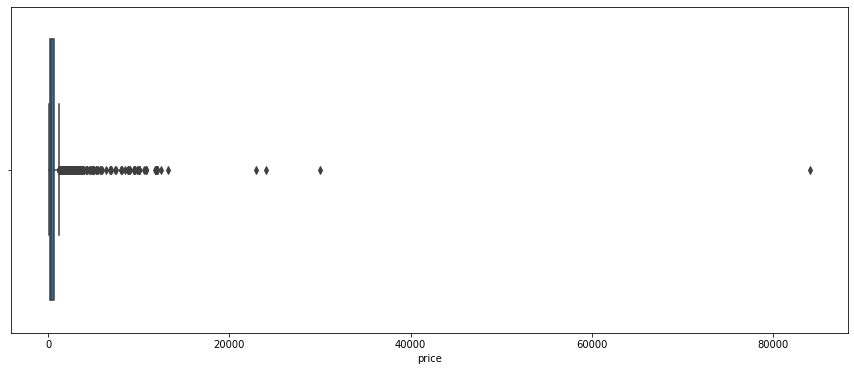

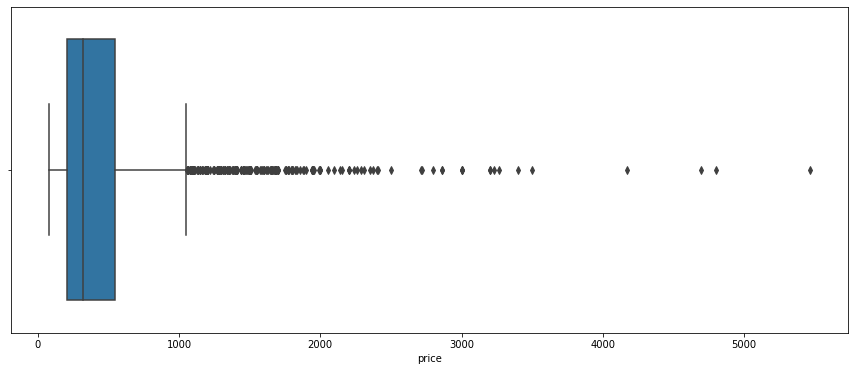

In [ ]:
plt.figure(figsize=(15,6))
sns.boxplot(data = listing_gz,x='price')
plt.figure(figsize=(15,6))
sns.boxplot(data = clean_price,x='price')
plt.show()

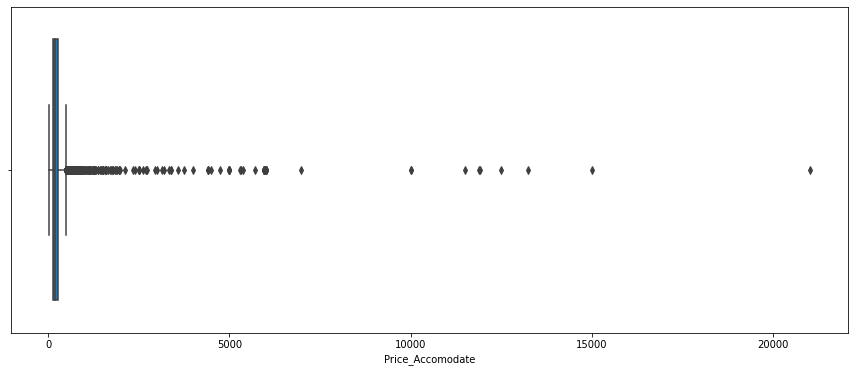

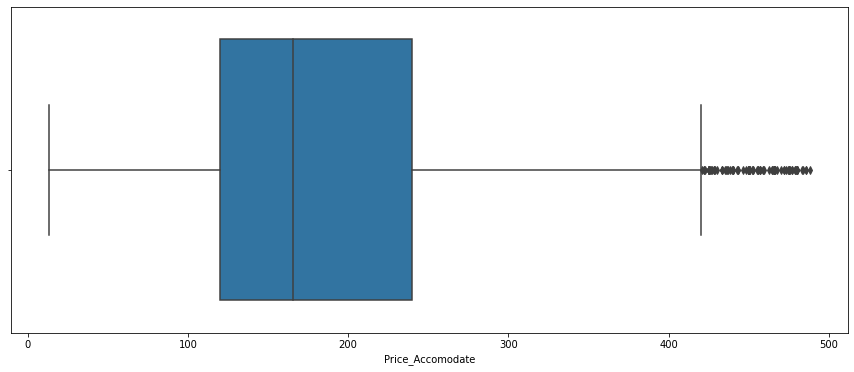

In [ ]:
plt.figure(figsize=(15,6))
sns.boxplot(data = listing_gz,x='Price_Accomodate')
plt.figure(figsize=(15,6))
sns.boxplot(data = clean_price,x='Price_Accomodate')
plt.show()

In [ ]:
draw_map(clean_price)

In [ ]:
check_high_price = clean_price[clean_price['price']>5000]

In [ ]:
draw_map(check_high_price)

In [ ]:
listing_gz = clean_price

### Rating & Reviews

In [ ]:
# % of values missing in each column
def missing_value_percentage(data_df):
    values_list = list()
    cols_list = list()

    for col in data_df.columns:
        pct_missing = np.mean(data_df[col].isnull())*100
        cols_list.append(col)
        values_list.append(pct_missing)

    percent_missing_df = pd.DataFrame()
    percent_missing_df['col'] = cols_list
    percent_missing_df['pct_missing'] = values_list

    return percent_missing_df

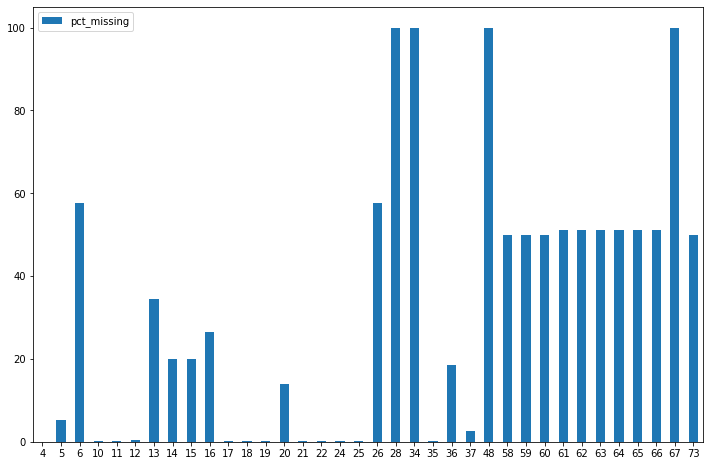

In [ ]:
# Overview of Missing data - listing.gz / review-related columns
listing_gz_percent_value_missing_df = missing_value_percentage(listing_gz)
listing_gz_percent_value_missing_df.loc[listing_gz_percent_value_missing_df.pct_missing > 0].plot(kind='bar', figsize=(12,8))
plt.xticks(rotation=0)
plt.show()

In [ ]:
# Fill missing data with nan - listing.gz / review columns
def fill_review_cols(data_df, label_name):
    first_review_column_index = data_df.columns.get_loc('number_of_reviews')
    last_review_column_index = data_df.columns.get_loc('review_scores_value')
    for col in data_df.columns[first_review_column_index:last_review_column_index+1]:
        missing = data_df[col].isnull().sum()
        if missing > 0:
            data_df[col] = data_df[col].fillna(label_name)

fill_review_cols(listing_gz, np.nan)

In [ ]:
# Remove duplicated data - listing.gz / review columns
def remove_duplicated_data_index_consideration(data_df):
    first_review_column_index = data_df.columns.get_loc('number_of_reviews')
    last_review_column_index = data_df.columns.get_loc('review_scores_value')
    for col in data_df.columns[first_review_column_index:last_review_column_index+1]:
        cols_other_than_id = list(data_df.columns)[1:]
        data_df.drop_duplicates(subset=cols_other_than_id, inplace=True)

remove_duplicated_data_index_consideration(listing_gz)

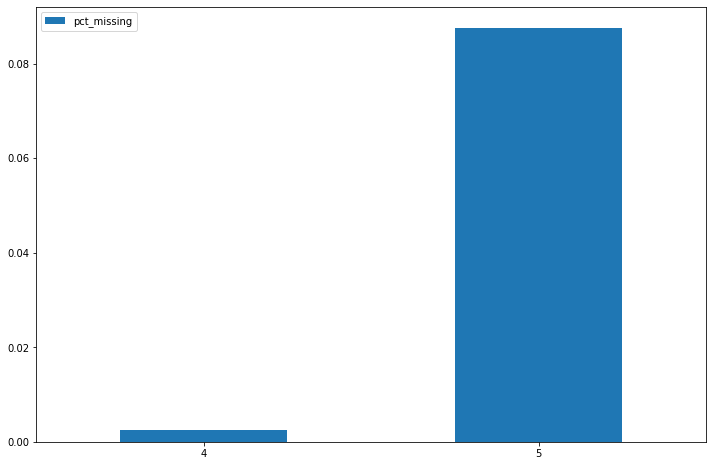

In [ ]:
# Overview of Missing data - review.gz
review_gz_percent_value_missing_df = missing_value_percentage(review_gz)
review_gz_percent_value_missing_df.loc[review_gz_percent_value_missing_df.pct_missing > 0].plot(kind='bar', figsize=(12,8))
plt.xticks(rotation=0)
plt.show()

In [ ]:
# Remove less affected missing data - review.gz
def drop_data(data_df):
    data_df.dropna(how='all')

drop_data(review_gz)

In [ ]:
# Remove duplicated data - review.gz
def remove_duplicated_data(data_df):
        cols_other_than_id = list(data_df.columns)[1:]
        data_df.drop_duplicates(subset=cols_other_than_id, inplace=True)

remove_duplicated_data(review_gz)

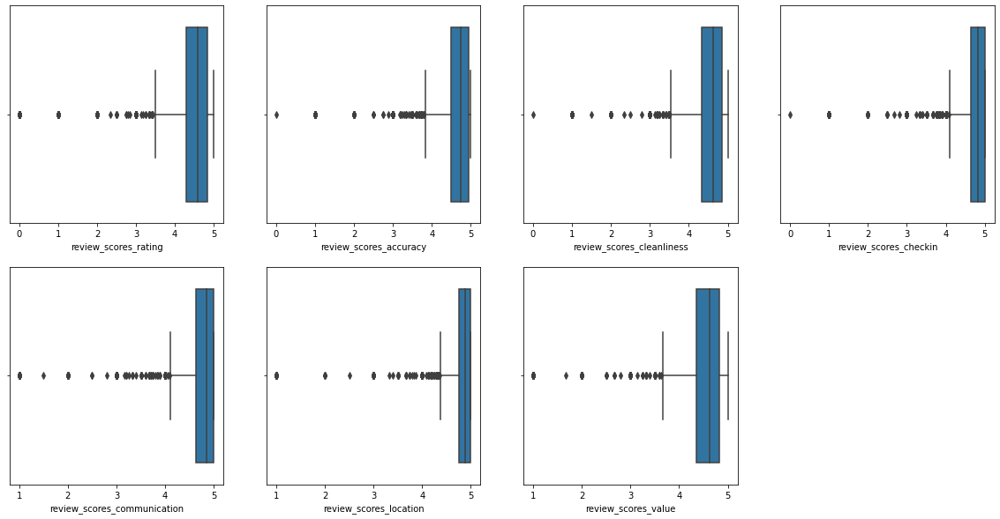

In [ ]:
# Outliers - listing.gz / review columns
plt.figure(figsize=(20, 10))

plt.subplot(241)
rating = listing_gz['review_scores_rating'].reset_index()
sns.boxplot(data=rating, x = 'review_scores_rating')

plt.subplot(242)
accuracy = listing_gz['review_scores_accuracy'].reset_index()
sns.boxplot(data=accuracy, x = 'review_scores_accuracy')

plt.subplot(243)
cleanliness = listing_gz['review_scores_cleanliness'].reset_index()
sns.boxplot(data=cleanliness, x = 'review_scores_cleanliness')

plt.subplot(244)
checkin = listing_gz['review_scores_checkin'].reset_index()
sns.boxplot(data=checkin, x = 'review_scores_checkin')

plt.subplot(245)
communication = listing_gz['review_scores_communication'].reset_index()
sns.boxplot(data=communication, x = 'review_scores_communication')

plt.subplot(246)
location = listing_gz['review_scores_location'].reset_index()
sns.boxplot(data=location, x = 'review_scores_location')

plt.subplot(247)
value = listing_gz['review_scores_value'].reset_index()
sns.boxplot(data=value, x = 'review_scores_value')

plt.show()

##**STEP 3: CHECK THE DUPLICATION**

In [ ]:
# Any duplicated rows?
listing_gz.duplicated().sum()

0

In [ ]:
# Any duplicated listing_id?
listing_gz['id'].duplicated().sum()

# So, there are no duplications in the table.

0

##**STEP 4: CHECK THE MISLABELED AND CORRUPTED DATA AND DETECT OUTLIERS**


In [ ]:
# check the Overview of the table
listing_gz.describe()

# some of the abnormalities:
# 1.beds :zero beds?


,id,host_id,host_response_rate,host_acceptance_rate,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,Price_Accomodate
count,5.083000e+03,5.083000e+03,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.00000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,5083.000000,2498.000000,2453.000000,2453.000000,2453.000000,2452.000000,2453.000000,2453.000000,5083.000000,5083.000000,5083.000000,5083.000000,2498.000000,5083.000000
mean,2.846160e+07,1.041417e+08,84.703198,69.579512,97.686996,22.294117,114.169927,2.676372,1.170962,1.307496,1.579579,682.277199,15.83435,860.501672,24.129451,50.094236,76.673618,269.874287,18.814480,4.372338,4.561561,4.461574,4.659001,4.669160,4.766775,4.467244,99.463703,17.903404,73.925634,7.083415,0.830809,295.909524
std,1.318053e+07,1.062427e+08,26.664098,26.105383,141.998465,0.016761,0.013129,2.428701,0.667591,0.787844,1.462543,1816.439739,23.05342,450.877251,10.255750,18.919608,26.746193,125.708989,47.194432,0.872446,0.651695,0.661528,0.611870,0.599468,0.486729,0.641571,139.019689,34.808018,119.610258,16.210555,1.146411,746.861239
min,6.907400e+04,8.086800e+04,0.000000,0.000000,0.000000,22.257470,114.121170,1.000000,0.000000,1.000000,0.000000,78.000000,1.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.010000,13.125000
25%,1.865754e+07,1.517493e+07,81.341035,57.000000,3.000000,22.280910,114.168060,2.000000,1.000000,1.000000,1.000000,216.000000,1.00000,365.000000,27.000000,55.000000,83.000000,173.000000,0.000000,4.280000,4.500000,4.330000,4.630000,4.640000,4.750000,4.350000,4.000000,0.000000,1.000000,0.000000,0.090000,125.000000
50%,3.113366e+07,6.770988e+07,98.448017,75.000000,13.000000,22.296180,114.171570,2.000000,1.000000,1.000000,1.000000,350.000000,5.00000,1125.000000,29.000000,59.000000,89.000000,364.000000,0.000000,4.590000,4.740000,4.630000,4.830000,4.850000,4.900000,4.620000,14.000000,2.000000,8.000000,0.000000,0.340000,175.000000
75%,3.881340e+07,1.564097e+08,100.000000,92.000000,230.000000,22.307170,114.176200,3.000000,1.000000,1.000000,2.000000,618.000000,29.00000,1125.000000,30.000000,60.000000,90.000000,365.000000,11.000000,4.830000,4.950000,4.860000,5.000000,5.000000,5.000000,4.820000,181.000000,19.000000,76.000000,4.000000,1.067500,270.875000
max,5.100460e+07,4.105823e+08,100.000000,100.000000,409.000000,22.326267,114.194900,16.000000,14.000000,14.000000,20.000000,84042.000000,365.00000,10000.000000,30.000000,60.000000,90.000000,365.000000,472.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,379.000000,132.000000,332.000000,64.000000,11.160000,21010.500000


**PROPERTY TYPE**

In [ ]:
# firstly we see how many listing have no beds:
listing_gz[listing_gz['beds'] == listing_gz['beds'].min()]['room_type'].value_counts() # 250
# I decide to drop all of the rooms
# get the indices
index = listing_gz.index
condition = listing_gz['beds'] == 0
beds_index = index[condition]
beds_index_list = beds_index.tolist()
# using index to drop rows where beds = 0
listing_gz.drop(index = beds_index_list, inplace = True)

# **EDA**

## Host

###How Fast you would get a Respond from Hosts & How Likely you are Accepted for a RSVP

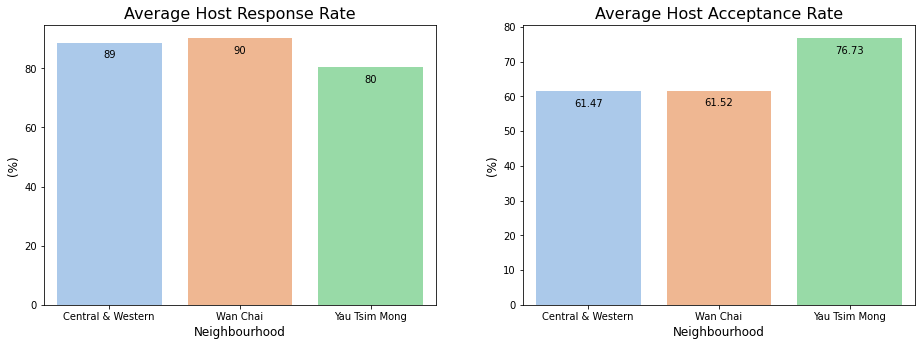

In [117]:
plt.figure(figsize=(14,6))

plt.subplot(121)
plot_response = listing_gz.groupby('neighbourhood_cleansed')['host_response_rate'].mean().reset_index()
plt.title('Average Host Response Rate', size=16)
rplot = sns.barplot(data= plot_response,
            x='neighbourhood_cleansed',
            y= 'host_response_rate',
            palette = 'pastel')
plt.xlabel('Neighbourhood', size=12)
plt.ylabel('(%)', size=12)

for p in rplot.patches:
  rplot.annotate(format(p.get_height(), '.0f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points')

plt.subplot(122)
plot_acc = listing_gz.groupby('neighbourhood_cleansed')['host_acceptance_rate'].mean().reset_index()
plt.title('Average Host Acceptance Rate', size=16)
aplot = sns.barplot(data= plot_acc,
            x='neighbourhood_cleansed',
            y= 'host_acceptance_rate',
            palette = 'pastel')
plt.xlabel('Neighbourhood', size=12)
plt.ylabel('(%)', size=12)

for p in aplot.patches:
  aplot.annotate(format(p.get_height(), '.2f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points')
  
plt.tight_layout(pad = 5)
plt.show()

### Superhosts Overview and How Do Hosts Communicate to the Tourists?

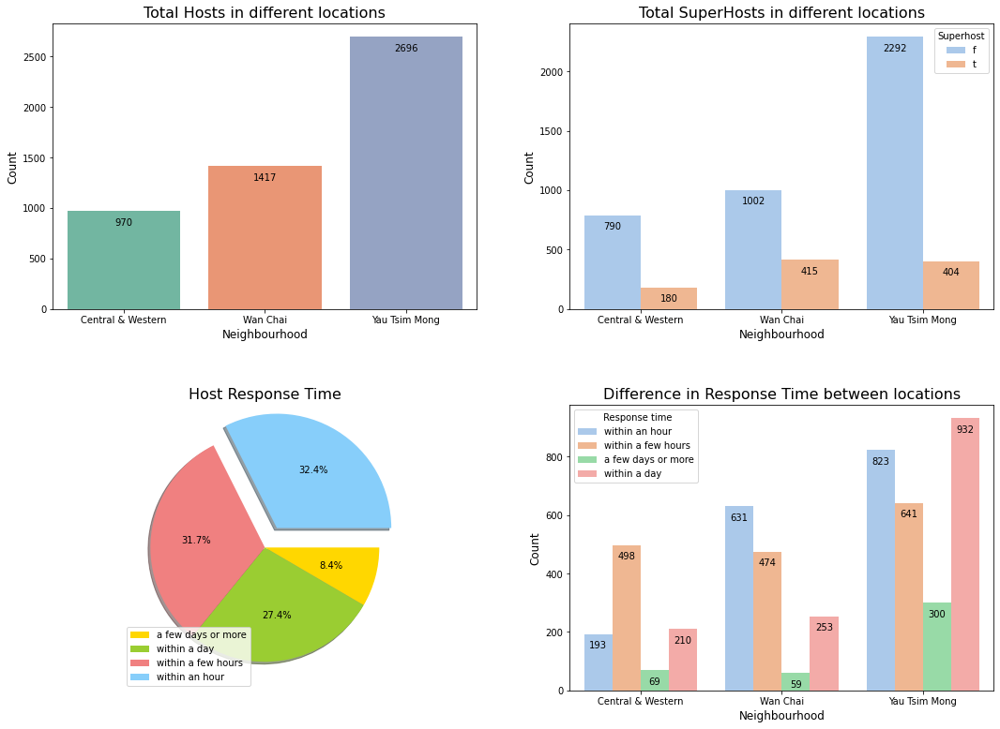

In [118]:
plt.figure(figsize=(16,12))

  #plot 1
plt.subplot(221)
plt.title('Total Hosts in different locations', size = 16)
hplot = sns.countplot(data = listing_gz,
              x = 'neighbourhood_cleansed',
              palette = 'Set2')
plt.xlabel('Neighbourhood', size = 12)
plt.ylabel('Count', size=12)

for p in hplot.patches:
  hplot.annotate(format(p.get_height(), '.0f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points')
  
  #plot 2
plt.subplot(222)
plt.title('Total SuperHosts in different locations', size = 16)
cplot = sns.countplot(data = listing_gz,
              x='neighbourhood_cleansed',
              hue='host_is_superhost',
              palette = 'pastel')
plt.xlabel('Neighbourhood', size = 12)
plt.ylabel('Count', size=12)
for i in cplot.patches:
  cplot.annotate(format(i.get_height(), '.0f'),
                 (i.get_x() + i.get_width() / 2., 
                 i.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points')
plt.legend(title='Superhost')

  #plot 3
values = listing_gz.groupby('host_response_time')['id'].count()
labels = ['a few days or more','within a day','within a few hours','within an hour']
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0,0,0,0.2)

plt.subplot(223)
plt.title('Host Response Time', size = 16)
plt.pie(values, colors=colors, autopct = '%1.1f%%', explode=explode, counterclock=False, shadow=True)
plt.legend(labels, loc = 'lower left')

  #plot 4
plt.subplot(224)
plt.title('Difference in Response Time between locations', size = 16)
tplot = sns.countplot(data = listing_gz,
              x='neighbourhood_cleansed',
              hue='host_response_time',
              palette = 'pastel')
plt.xlabel('Neighbourhood', size = 12)
plt.ylabel('Count', size=12)
plt.legend(title=' Response time')

for p in tplot.patches:
  tplot.annotate(format(p.get_height(), '.0f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points')

plt.tight_layout(pad = 5)
plt.show()

### Which Location is easier to Book Instantly?

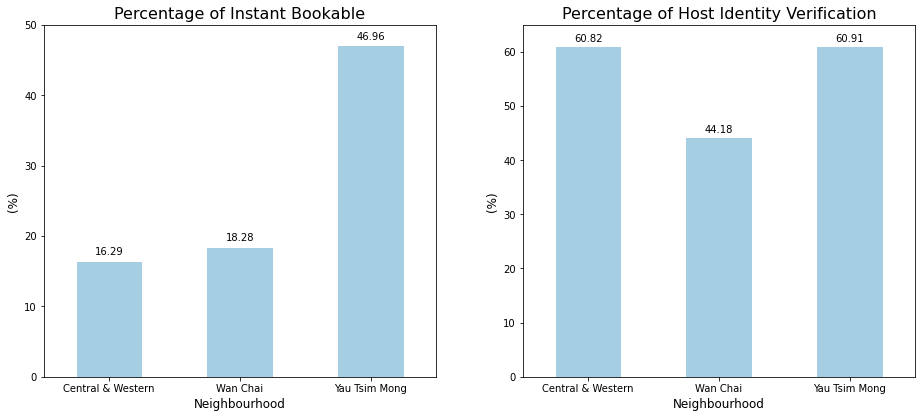

In [127]:
plt.figure(figsize=(14,7))

#plot 1
plt.subplot(121)
t= listing_gz[listing_gz['instant_bookable'] == 't'].groupby('neighbourhood_cleansed')['host_id'].count()
total = listing_gz.groupby('neighbourhood_cleansed')['instant_bookable'].count()
yvalues = (t/total*100).round(decimals=2)

plt.title('Percentage of Instant Bookable', size = 16)

yvalues.plot(kind='bar', rot=0, colormap = 'Paired')
plt.xlabel('Neighbourhood', size=12)
plt.ylabel('(%)', size=12)

for i in range(yvalues.shape[0]):
    plt.text(i, yvalues.values[i] + 1, yvalues.values[i], ha='center')
plt.ylim(0,50)

# plot 2
plt.subplot(122)
verified = listing_gz[listing_gz['host_identity_verified'] == 't'].groupby('neighbourhood_cleansed')['host_identity_verified'].count()
total_v = listing_gz.groupby('neighbourhood_cleansed')['host_identity_verified'].count()
vplot = (verified/total_v*100).round(decimals=2)

plt.title('Percentage of Host Identity Verification', size = 16)
vplot.plot(kind='bar', rot=0, colormap = 'Paired')
plt.xlabel('Neighbourhood', size=12)
plt.ylabel('(%)', size=12)

for i in range(vplot.shape[0]):
    plt.text(i, vplot.values[i] + 1, vplot.values[i], ha='center')
plt.ylim(0,65)

plt.tight_layout(pad=5)
plt.show()

### Amenities

In [128]:
### Get list of amenities:
lst = []
def amenities(row):
  a = row.strip('[]').replace('"','').split(', ')
  return lst.extend(a)

listing_gz['amenities'].apply(amenities)
df = pd.DataFrame(lst, columns = ['Amenities'])

basics = ['Wifi','Air conditioning','Elevator','Kitchen','Hot water','Shampoo','Refrigerator']
df[df['Amenities'].isin(basics)].value_counts()

Amenities       
Air conditioning    4929
Wifi                4862
Shampoo             3111
Elevator            2996
Kitchen             2768
Hot water           2300
Refrigerator        1024
dtype: int64

In [131]:
# Get Amenities count & percentage over total listings
ans= {'Wifi': None,
      'Air conditioning': None,
      'Elevator': None,
      'Kitchen': None,
      'Hot water': None,
      'Shampoo': None,
      'Refrigerator': None
      }

for i in basics:
  ans[i] = listing_gz[listing_gz['amenities'].str.contains(i) == True].groupby('neighbourhood_cleansed')['amenities'].count()

amenities = pd.concat(ans.values(), axis = 1, keys = basics)

percent_dict = {'Wifi': None,
      'Air conditioning': None,
      'Elevator': None,
      'Kitchen': None,
      'Hot water': None,
      'Shampoo': None,
      'Refrigerator': None}

total_listing = listing_gz.groupby('neighbourhood_cleansed')['listing_url'].count()

for i in basics:
  percent_dict[i] = (amenities[i]/total_listing)*100

percent = pd.concat(percent_dict.values(), axis = 1, keys = basics)
percent

,Wifi,Air conditioning,Elevator,Kitchen,Hot water,Shampoo,Refrigerator
neighbourhood_cleansed,,,,,,,
Central & Western,94.020619,96.804124,43.298969,85.773196,41.134021,44.948454,24.639175
Wan Chai,95.836274,98.235709,47.071277,75.299929,34.015526,45.448130,19.124912
Yau Tsim Mong,96.327893,96.364985,70.808605,32.232938,53.004451,75.333828,19.065282


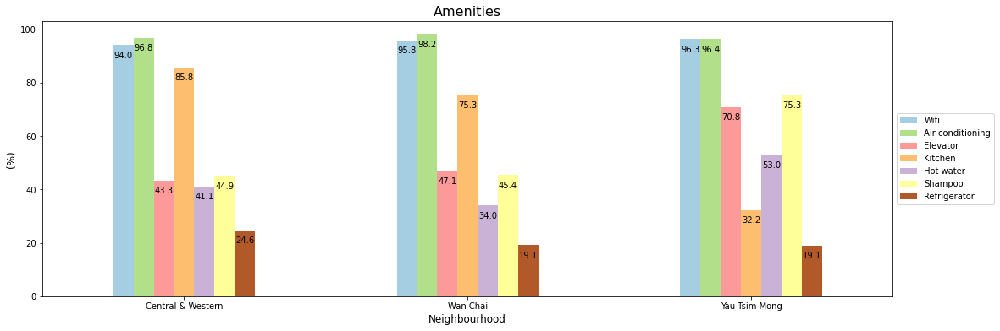

In [142]:
pplot = percent.plot(figsize = (18,6),kind='bar', rot=0, colormap = 'Paired')
pplot.set_title('Amenities', size = 16)
plt.xlabel('Neighbourhood', size=12)
plt.ylabel('(%)', size=12)

for p in pplot.patches:
  pplot.annotate(format(p.get_height(), '.1f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va='center',
                 xytext=(0,-12),
                textcoords = 'offset points',
                 size = 10)

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

## Property

### Room Types




**OVERVIEW**

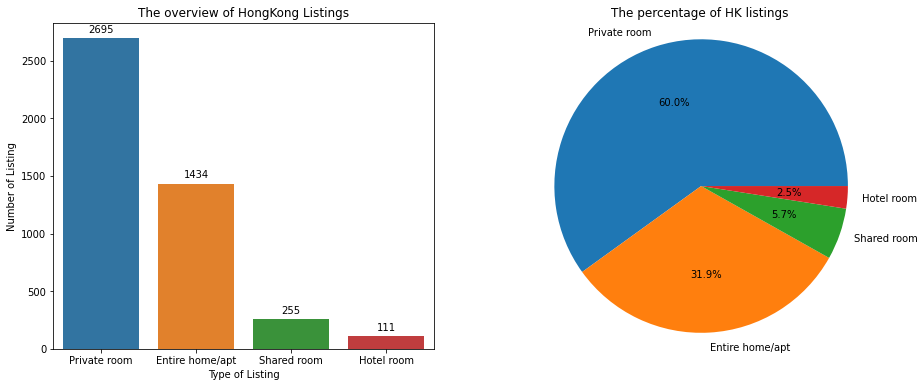

In [ ]:
# Overview of HK listing
overview = listing_gz.groupby('room_type')['id'].count().loc[['Private room', 'Entire home/apt','Shared room','Hotel room']].reset_index()


plt.figure(figsize=(15,6))
plt.subplot(121)
sns.countplot(data=listing_gz,x='room_type',order=['Private room','Entire home/apt','Shared room','Hotel room'])
plt.xlabel('Type of Listing')
plt.ylabel('Number of Listing')
plt.title('The overview of HongKong Listings')
for i in range(overview.shape[0]):
  plt.text(i, overview.values[i][1] + 50 , overview.values[i][1],ha='center')
plt.subplot(122)
plt.pie(overview['id'],labels=overview['room_type'],autopct='%1.1f%%')
plt.title('The percentage of HK listings')
plt.axis('equal')

plt.show()  


**NUMBER OF LISTINGS FOR DIFFERENT GROUP OF TOURISTS

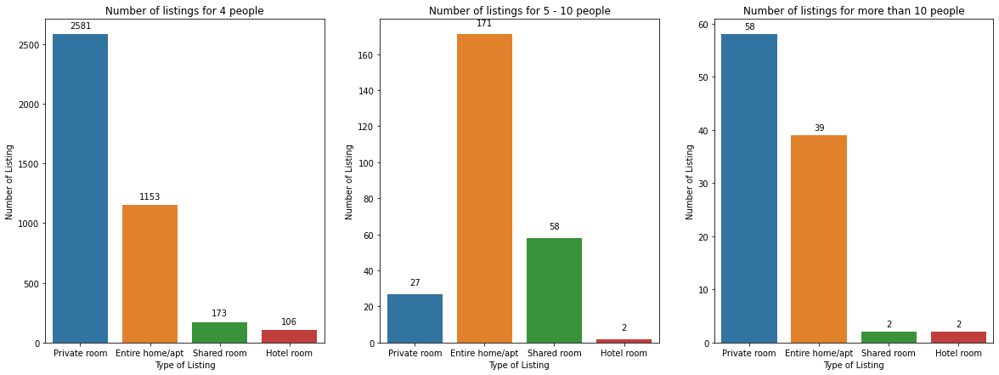

In [ ]:


#  in each sectoc, how many listings that allows less than 4, from 5 - 10 and more than 10 people 
group1 = listing_gz[listing_gz['accommodates'] <= 4].groupby('room_type')['id'].count().loc[['Private room','Entire home/apt', 'Shared room', 'Hotel room']].reset_index()
group2 = listing_gz[(listing_gz['accommodates'] > 5) & (listing_gz['accommodates'] < 10) ].groupby('room_type')['id'].count().loc[['Private room','Entire home/apt', 'Shared room', 'Hotel room']].reset_index()
group3 = listing_gz[listing_gz['accommodates'] > 10].groupby('room_type')['id'].count().loc[['Private room','Entire home/apt', 'Shared room', 'Hotel room']].reset_index()
# making three countplot graphs
plt.figure(figsize= (20,7)) 
plt.subplot(131) #first group
sns.countplot(data=listing_gz[listing_gz['accommodates']<=4],x='room_type',order=['Private room','Entire home/apt','Shared room','Hotel room'])
plt.xlabel('Type of Listing')
plt.ylabel('Number of Listing')
plt.title('Number of listings for 4 people')
for i in range(group1.shape[0]):
  plt.text(i, group1.values[i][1] + 50 , group1.values[i][1],ha='center')
#second group
plt.subplot(132) 
sns.countplot(data=listing_gz[(listing_gz['accommodates'] > 5) & (listing_gz['accommodates'] < 10) ],x='room_type',order=['Private room','Entire home/apt','Shared room','Hotel room'])
plt.xlabel('Type of Listing')
plt.ylabel('Number of Listing')
plt.title('Number of listings for 5 - 10 people')
for i in range(group2.shape[0]):
  plt.text(i, group2.values[i][1] + 5 , group2.values[i][1],ha='center')
# third group
plt.subplot(133) 
sns.countplot(data=listing_gz[listing_gz['accommodates'] > 10],x='room_type',order=['Private room','Entire home/apt','Shared room','Hotel room'])
plt.xlabel('Type of Listing')
plt.ylabel('Number of Listing')
plt.title('Number of listings for more than 10 people')
for i in range(group3.shape[0]):
  plt.text(i, group3.values[i][1] + 1 , group3.values[i][1],ha='center')

**MINIMUM NIGHTS REQUIRED**

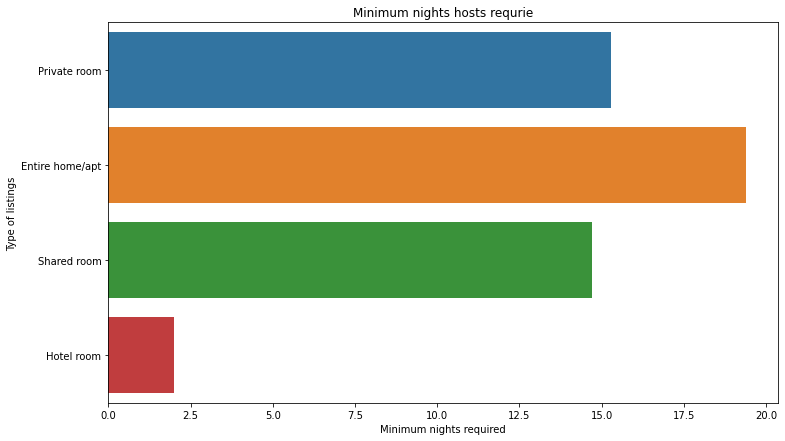

In [ ]:
# minimum nights that hosts require
minimum = listing_gz.groupby('room_type')['minimum_nights'].mean().round(decimals = 1).loc[['Private room','Entire home/apt','Shared room','Hotel room']].reset_index()
plt.figure(figsize= (12,7)) 
sns.barplot(x='minimum_nights',y='room_type',data=minimum)
plt.xlabel('Minimum nights required')
plt.ylabel('Type of listings')
plt.title('Minimum nights hosts requrie')
plt.show()

**ESTIMATE OF AVAILABILITY RATE**

In [ ]:
# Availability of these type: 
available = listing_gz.groupby('room_type')[['availability_30','availability_60','availability_90','availability_365']].mean().round(decimals=1).reset_index()

availability = {'Time':['30 days','60 days','90 days','365 days'],
                'Entire home/apt':[21.5,45.4,70.4,249.3],
                'Hotel room':[23.6,48.6,74.4,287.6],
                'Private room':[25.1,51.9,79.1,267.7],
                'Shared room':[28.8,58.3,87.7,317.5]}
new_data = pd.DataFrame(data=availability)

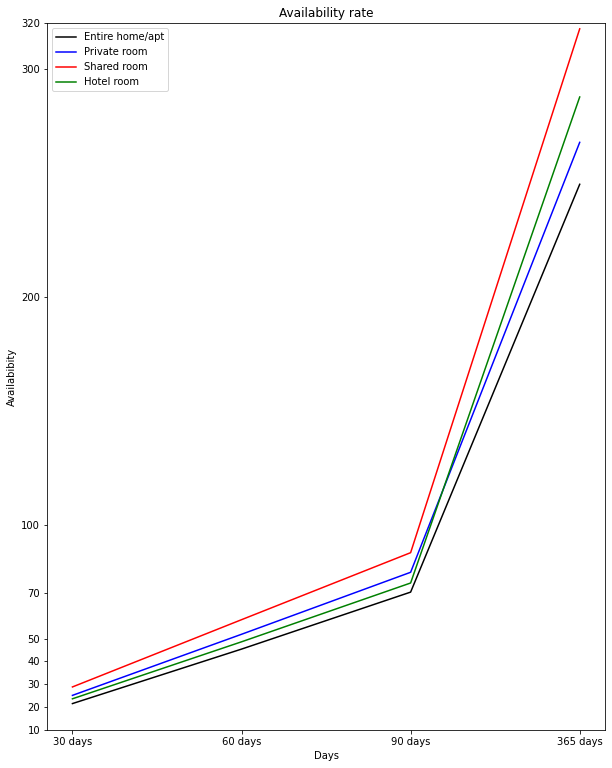

In [ ]:
plt.figure(figsize=(10,13))
plt.plot('Time','Entire home/apt',data =new_data,color = 'black')
plt.plot('Time','Private room',data =new_data,color = 'blue')
plt.plot('Time','Shared room',data =new_data,color = 'red')
plt.plot('Time', 'Hotel room', data = new_data,color ='green')
plt.legend()
plt.xlabel('Days')
plt.ylabel('Availabibity')
plt.title('Availability rate')
plt.ylim(10,320)
plt.yticks(ticks =[10,20,30,40,50,70,100,200,300,320])
plt.show()


**NUMBER OF BEDS AN BATHROOMS ACCORDING TO TYPE OF LISTINGS**


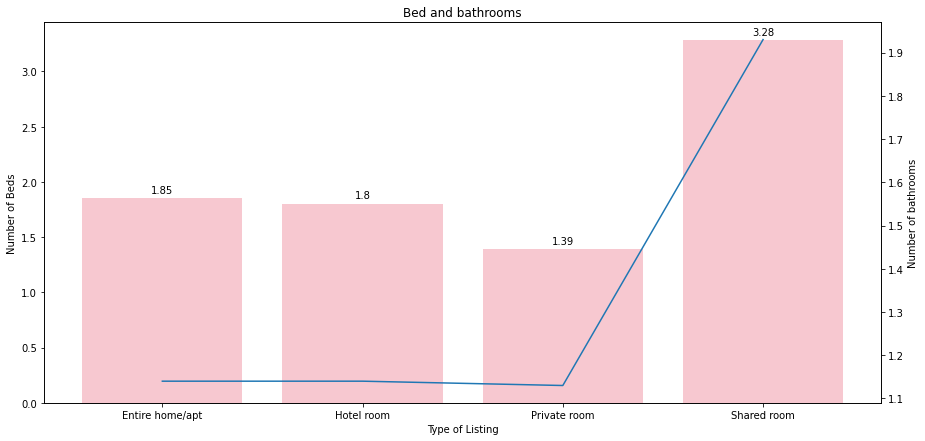

In [ ]:
# beds and bathrooms 
bed_and_bath = listing_gz.groupby('room_type')[['beds','bathrooms']].mean().round(decimals =2).reset_index()
bed_and_bath
plt.figure(figsize=(15,7))
sns.barplot(data=bed_and_bath,
            x='room_type',
            y='beds',color='pink'
            )
plt.xlabel('Type of Listing')
plt.ylabel('Number of Beds')
for i in range(bed_and_bath.shape[0]):
  plt.text(i, bed_and_bath.values[i][1] +0.05 , bed_and_bath.values[i][1],ha='center')
plt.twinx()

sns.lineplot(data=bed_and_bath,
             x='room_type',
             y='bathrooms')  
plt.ylabel('Number of bathrooms')    
plt.title('Bed and bathrooms')

plt.show()

**TYPE OF ROOM LOCATIONS**


In [ ]:
# Assign colors
colors = {'Hotel room':'red', 'Private room' : 'blue', 'Entire home/apt': 'orange','Shared room': 'green'} #22.296524032148113, 114.16951206388765

# select only 3 neighbourhood


lst3 = listing_gz[(listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong')|(listing_gz['neighbourhood_cleansed']=='Wan Chai')|(listing_gz['neighbourhood_cleansed']=='Central & Western')]

# draw map with lat long from google map
map3 = folium.Map(location=[22.2965, 114.1695], zoom_start=13)

# apply folium to selection (with color)
lst3.apply(lambda row:folium.Circle(location=[row["latitude"], row["longitude"]], 
                                              radius=5, color=colors[row['room_type']], 
                                              fill=True, fill_color=colors[row['room_type']],
                                              popup=row['listing_url'])
                                              .add_to(map3), axis=1)
map3

## Price

### Price of 3 location comparision

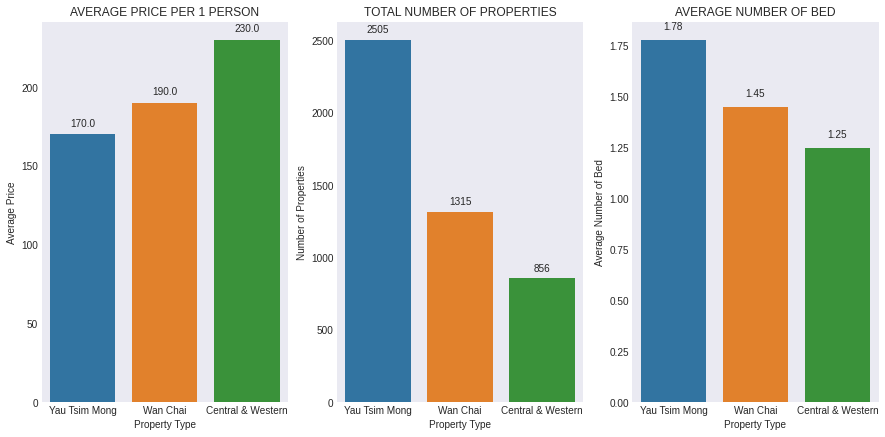

In [ ]:
#@title
## FILTER OUT 3 CENTRAL LOCATIONS
#listing_gz =  listing_gz[listing_gz['neighbourhood_cleansed'].isin(['Yau Tsim Mong','Wan Chai','Central & Western'])]


plot_data1 = listing_gz.groupby('neighbourhood_cleansed').mean()['review_scores_rating'].round(2).loc[['Yau Tsim Mong','Wan Chai','Central & Western']].reset_index()
plot_data2 = listing_gz.groupby('neighbourhood_cleansed').mean()['Price_Accomodate'].round().loc[['Yau Tsim Mong','Wan Chai','Central & Western']].reset_index()
plot_data3 = listing_gz.groupby('neighbourhood_cleansed').mean()['beds'].round(2).loc[['Yau Tsim Mong','Wan Chai','Central & Western']].reset_index()
plot_data4 = listing_gz.groupby('neighbourhood_cleansed')['id'].count().loc[['Yau Tsim Mong','Wan Chai','Central & Western']].reset_index()

plt.figure(figsize= (15,7))

# plt.subplot(224)

# sns.barplot(data=plot_data1,
#                 x="neighbourhood_cleansed",
#                 y="review_scores_rating",
#                 order=['Yau Tsim Mong','Wan Chai','Central & Western'])
# for i in range(plot_data1.shape[0]):
#     plt.text(i, plot_data1.values[i][1]+0.1, plot_data1.values[i][1], ha = 'center')
# plt.xlabel('Property Type')
# plt.ylabel('Average Rating')
# plt.title('AVERAGE RATING')

plt.subplot(131)
sns.barplot(data=plot_data2,
                x="neighbourhood_cleansed",
                y="Price_Accomodate",
                order=['Yau Tsim Mong','Wan Chai','Central & Western'])
for i in range(plot_data2.shape[0]):
    plt.text(i, plot_data2.values[i][1]+5, plot_data2.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('AVERAGE PRICE PER 1 PERSON')

plt.subplot(133)
sns.barplot(data=plot_data3,
                x="neighbourhood_cleansed",
                y="beds",
                order=['Yau Tsim Mong','Wan Chai','Central & Western'])
for i in range(plot_data3.shape[0]):
    plt.text(i, plot_data3.values[i][1]+0.05, plot_data3.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Number of Bed')
plt.title('AVERAGE NUMBER OF BED')

plt.subplot(132)
sns.countplot(data=listing_gz,
                x="neighbourhood_cleansed",
                order=['Yau Tsim Mong','Wan Chai','Central & Western'])
for i in range(plot_data4.shape[0]):
    plt.text(i, plot_data4.values[i][1]+50, plot_data4.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Number of Properties')
plt.title('TOTAL NUMBER OF PROPERTIES')


plt.show()

# for i in range(overview.shape[0]):
#   plt.text(i, overview.values[i][1] + 50 , overview.values[i][1],ha='center')



*   Central & Western has highest average price per 1 person while have lowest number of Properties and average number of Bed => Higher class







### Price vs Room type

In [ ]:
listing_gz.groupby('room_type')['price'].mean()

room_type
Entire home/apt    702.087159
Hotel room         424.905983
Private room       326.572246
Shared room        202.826923
Name: price, dtype: float64

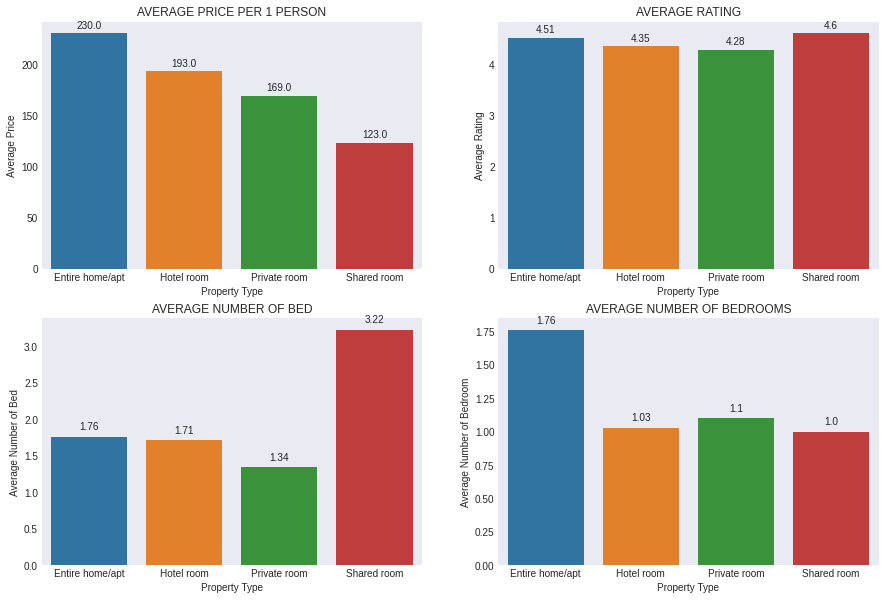

In [ ]:
#@title
plot_data1 = listing_gz.groupby('room_type').mean()['review_scores_rating'].round(2).loc[['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']].reset_index()
plot_data2 = listing_gz.groupby('room_type').mean()['Price_Accomodate'].round().loc[['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']].reset_index()
plot_data3 = listing_gz.groupby('room_type').mean()['beds'].round(2).loc[['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']].reset_index()
plot_data4 = listing_gz.groupby('room_type').mean()['bedrooms'].round(2).loc[['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']].reset_index()

plt.figure(figsize= (15,10))

plt.subplot(222)

sns.barplot(data=plot_data1,
                x="room_type",
                y="review_scores_rating",
                order=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'])
for i in range(plot_data1.shape[0]):
    plt.text(i, plot_data1.values[i][1]+0.1, plot_data1.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Rating')
plt.title('AVERAGE RATING')

plt.subplot(221)
sns.barplot(data=plot_data2,
                x="room_type",
                y="Price_Accomodate",
                order=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'])
for i in range(plot_data2.shape[0]):
    plt.text(i, plot_data2.values[i][1]+5, plot_data2.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('AVERAGE PRICE PER 1 PERSON')

plt.subplot(223)
sns.barplot(data=plot_data3,
                x="room_type",
                y="beds",
                order=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'])
for i in range(plot_data3.shape[0]):
    plt.text(i, plot_data3.values[i][1]+0.1, plot_data3.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Number of Bed')
plt.title('AVERAGE NUMBER OF BED')

plt.subplot(224)
sns.barplot(data=plot_data4,
                x="room_type",
                y="bedrooms",
                order=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'])
for i in range(plot_data4.shape[0]):
    plt.text(i, plot_data4.values[i][1]+0.05, plot_data4.values[i][1], ha = 'center')
plt.xlabel('Property Type')
plt.ylabel('Average Number of Bedroom')
plt.title('AVERAGE NUMBER OF BEDROOMS')


plt.show()

* Average Price per Person increase from Shared room to Entire home accordingly

* There is no relationship between Price and Rating

* Overall, the price of each Property Type increase along with the number of beds, except for Shared room type, since shared room's priority is to maximise number of person per 1 location

* There seem to be a relationship bw price per property type and number of Bedroom. However Hotel room price is higher than Private room while having fewer bedrooms because Hotel room price also includes other hotel services and facilities.

### Price and Rating Histogram

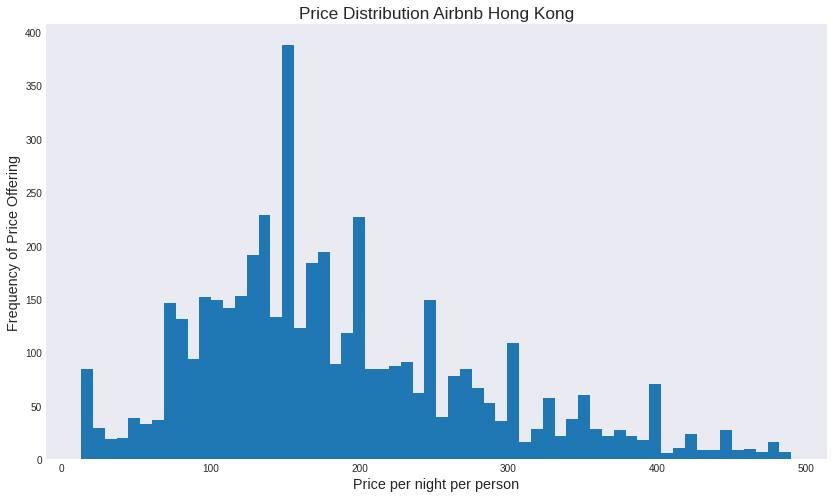

In [ ]:
#@title
plt.figure(figsize=(14, 8))

listing_gz["Price_Accomodate"].plot(kind='hist', bins = 60)
plt.title('Price Distribution Airbnb Hong Kong', size = "xx-large")
plt.xlabel("Price per night per person", size = "x-large")
plt.ylabel("Frequency of Price Offering", size = "x-large")
plt.show()


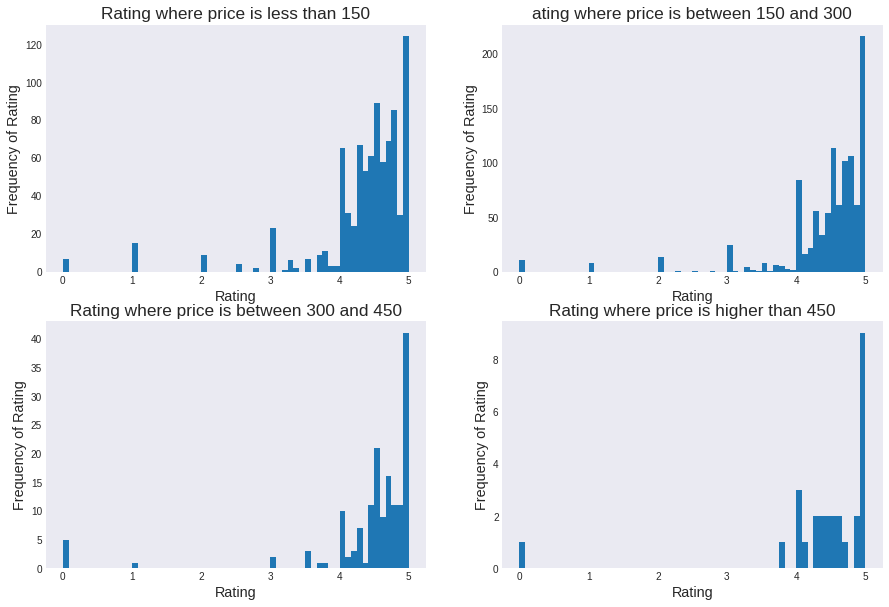

In [ ]:
#@title
price1 = listing_gz[listing_gz["Price_Accomodate"]<150]
price150 = listing_gz[(listing_gz["Price_Accomodate"]>150) & (listing_gz["Price_Accomodate"]<=300)]
price300 = listing_gz[(listing_gz["Price_Accomodate"]>350) & (listing_gz["Price_Accomodate"]<=450)]
price450 = listing_gz[listing_gz["Price_Accomodate"]>450]

plt.figure(figsize=(15, 10))

plt.subplot(221)
price1["review_scores_rating"].plot(kind='hist', bins = 60)
plt.title('Rating where price is less than 150', size = "xx-large")
plt.xlabel("Rating", size = "x-large")
plt.ylabel("Frequency of Rating", size = "x-large")

plt.subplot(222)
price150["review_scores_rating"].plot(kind='hist', bins = 60)
plt.title('ating where price is between 150 and 300', size = "xx-large")
plt.xlabel("Rating", size = "x-large")
plt.ylabel("Frequency of Rating", size = "x-large")

plt.subplot(223)
price300["review_scores_rating"].plot(kind='hist', bins = 60)
plt.title('Rating where price is between 300 and 450', size = "xx-large")
plt.xlabel("Rating", size = "x-large")
plt.ylabel("Frequency of Rating", size = "x-large")

plt.subplot(224)
price450["review_scores_rating"].plot(kind='hist', bins = 60)
plt.title('Rating where price is higher than 450', size = "xx-large")
plt.xlabel("Rating", size = "x-large")
plt.ylabel("Frequency of Rating", size = "x-large")

plt.show()

In general, the proportion of Rating among price range are quite similar, however, the higer the price, the lower of the low rating.

##  Rating & Reviews

### Reviews per Neighbourhood

  neighbourhood_cleansed  number_of_reviews
0      Central & Western                930
1               Wan Chai               1361
2          Yau Tsim Mong               2597


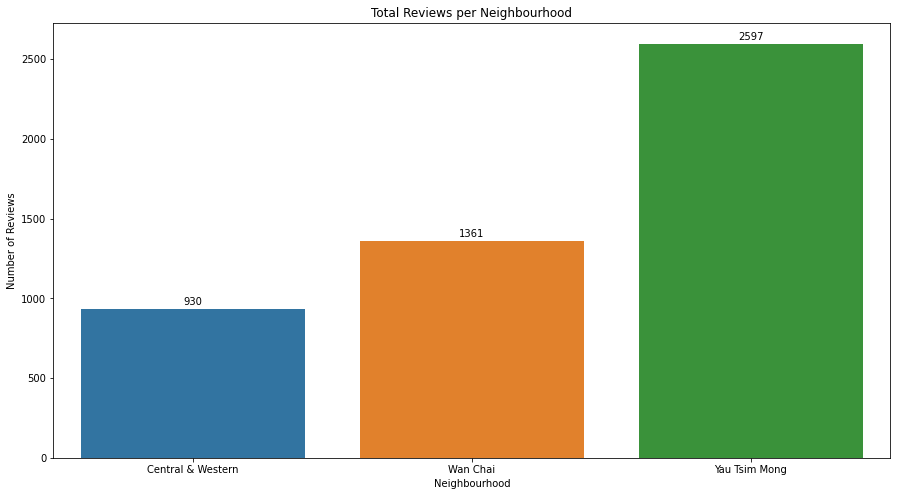

In [ ]:
# Reviews per Neighbourhood
neighbourhood_review = listing_gz.groupby(['neighbourhood_cleansed'])['number_of_reviews'].count().reset_index()
print(neighbourhood_review)

plt.figure(figsize=(15, 8))
chart_obj = sns.barplot(data=neighbourhood_review, x='neighbourhood_cleansed', y='number_of_reviews')
plt.xlabel('Neighbourhood')
plt.ylabel('Number of Reviews')
plt.title('Total Reviews per Neighbourhood')
plt.xticks(rotation=0)

for bar in chart_obj.patches:
    chart_obj.annotate("%.0f" % bar.get_height(), (bar.get_x() + bar.get_width() / 2., bar.get_height()+15),
                 ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')
    
plt.show()

### Number of Room Reviews per Neighbourhood

   neighbourhood_cleansed        room_type  number_of_reviews
0       Central & Western  Entire home/apt                473
1       Central & Western       Hotel room                  4
2       Central & Western     Private room                421
3       Central & Western      Shared room                 32
4                Wan Chai  Entire home/apt                520
5                Wan Chai       Hotel room                  4
6                Wan Chai     Private room                738
7                Wan Chai      Shared room                 99
8           Yau Tsim Mong  Entire home/apt                619
9           Yau Tsim Mong       Hotel room                132
10          Yau Tsim Mong     Private room               1695
11          Yau Tsim Mong      Shared room                151


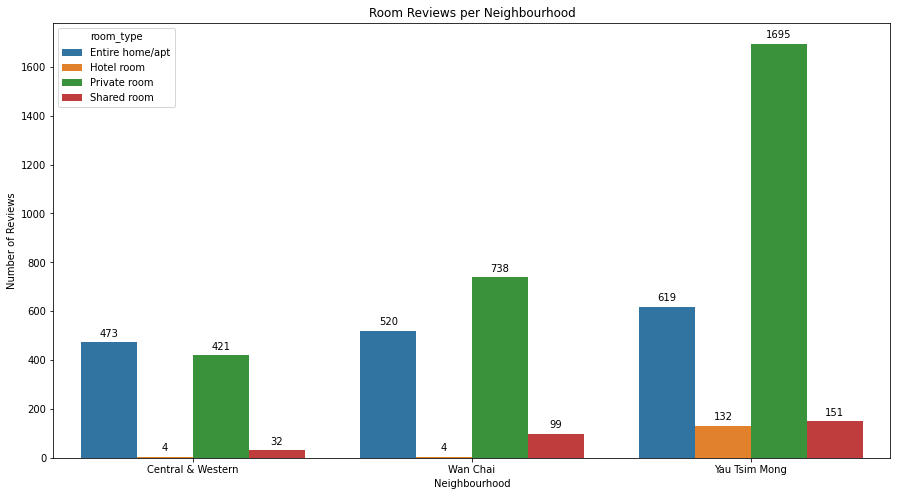

In [ ]:
# Number of Room Reviews per Neighbourhood
neighbourhood_room_review = listing_gz.groupby(['neighbourhood_cleansed', 'room_type'])['number_of_reviews'].count().reset_index()
print(neighbourhood_room_review)

plt.figure(figsize=(15, 8))
chart_obj = sns.barplot(data=neighbourhood_room_review, x='neighbourhood_cleansed', y='number_of_reviews', hue='room_type')
plt.xlabel('Neighbourhood')
plt.ylabel('Number of Reviews')
plt.title('Room Reviews per Neighbourhood')
plt.xticks(rotation=0)

for bar in chart_obj.patches:
    chart_obj.annotate("%.0f" % bar.get_height(), (bar.get_x() + bar.get_width() / 2., bar.get_height()+15),
                 ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')
    
plt.show()

### Review Score Rating Distribution

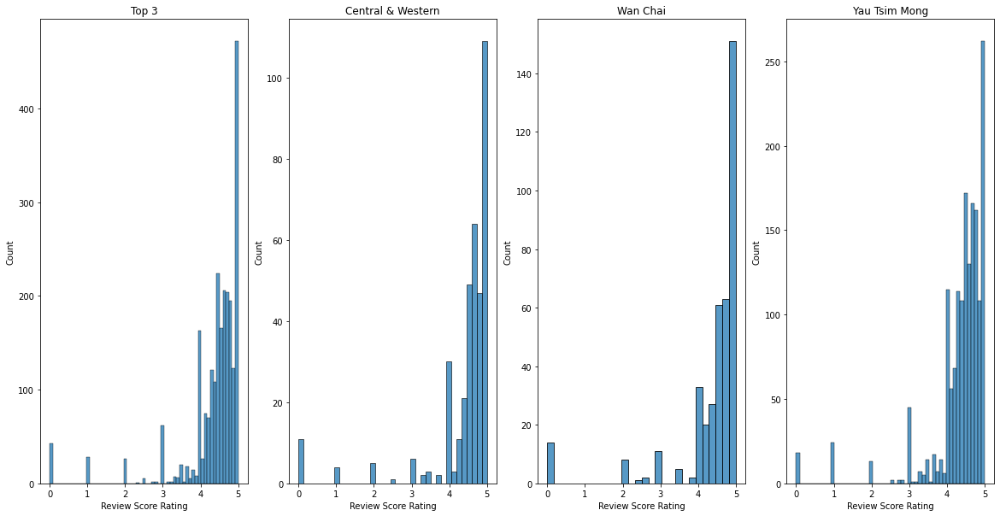

In [ ]:
# Review Score Rating Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_rating')
plt.title('Top 3')
plt.xlabel('Review Score Rating')

central_western = listing_gz['review_scores_rating'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
plt.subplot(142)
sns.histplot(data=central_western, x='review_scores_rating')
plt.title('Central & Western')
plt.xlabel('Review Score Rating')

wan_chai = listing_gz['review_scores_rating'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
plt.subplot(143)
sns.histplot(data=wan_chai, x='review_scores_rating')
plt.title('Wan Chai')
plt.xlabel('Review Score Rating')

yau_tsim_mong = listing_gz['review_scores_rating'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
plt.subplot(144)
sns.histplot(data=yau_tsim_mong, x='review_scores_rating')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Rating')

plt.show()

### Review Score Accuracy Distribution

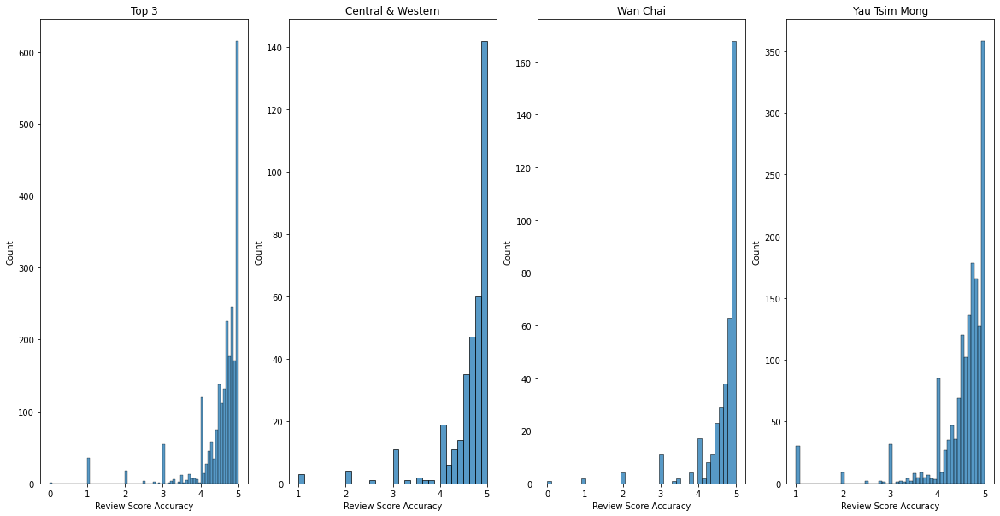

In [ ]:
# Review Score Accuracy Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_accuracy')
plt.title('Top 3')
plt.xlabel('Review Score Accuracy')

plt.subplot(142)
central_western = listing_gz['review_scores_accuracy'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_accuracy')
plt.title('Central & Western')
plt.xlabel('Review Score Accuracy')

plt.subplot(143)
wan_chai = listing_gz['review_scores_accuracy'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_accuracy')
plt.title('Wan Chai')
plt.xlabel('Review Score Accuracy')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_accuracy'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_accuracy')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Accuracy')

plt.show()

### Review Score Cleanliness Distribution

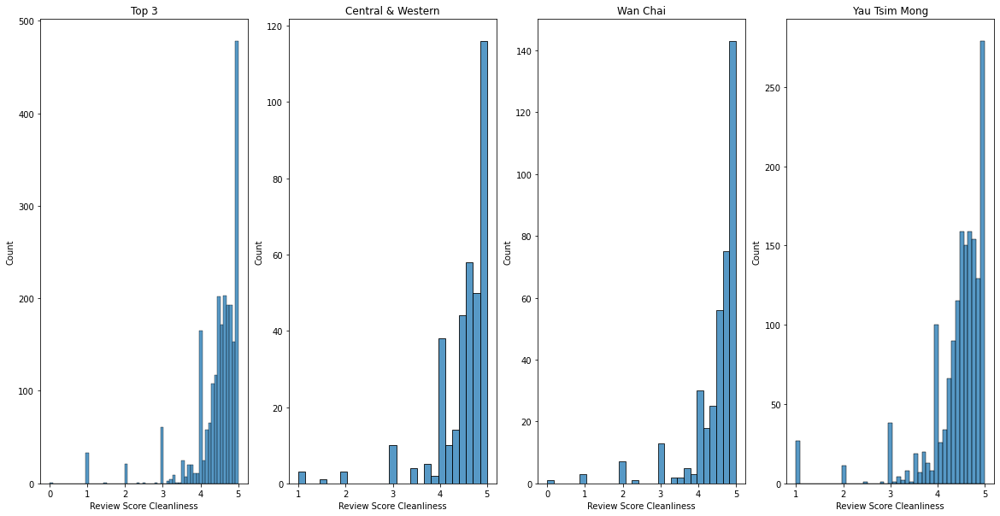

In [ ]:
# Review Score Cleanliness Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_cleanliness')
plt.title('Top 3')
plt.xlabel('Review Score Cleanliness')

plt.subplot(142)
central_western = listing_gz['review_scores_cleanliness'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_cleanliness')
plt.title('Central & Western')
plt.xlabel('Review Score Cleanliness')

plt.subplot(143)
wan_chai = listing_gz['review_scores_cleanliness'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_cleanliness')
plt.title('Wan Chai')
plt.xlabel('Review Score Cleanliness')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_cleanliness'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_cleanliness')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Cleanliness')

plt.show()

### Review Score Checkin Distribution

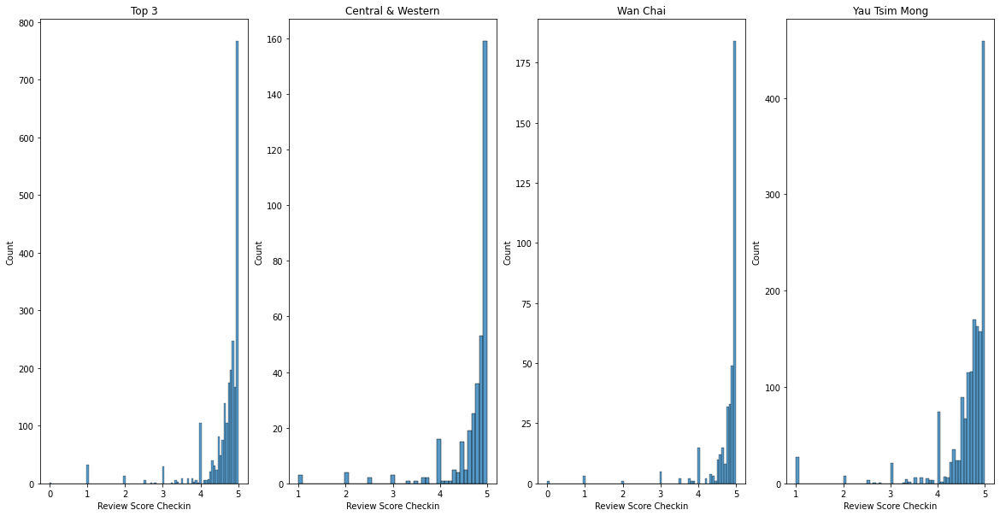

In [ ]:
# Review Score Checkin Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_checkin')
plt.title('Top 3')
plt.xlabel('Review Score Checkin')

plt.subplot(142)
central_western = listing_gz['review_scores_checkin'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_checkin')
plt.title('Central & Western')
plt.xlabel('Review Score Checkin')

plt.subplot(143)
wan_chai = listing_gz['review_scores_checkin'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_checkin')
plt.title('Wan Chai')
plt.xlabel('Review Score Checkin')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_checkin'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_checkin')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Checkin')

plt.show()

###Review Score Communication Distribution

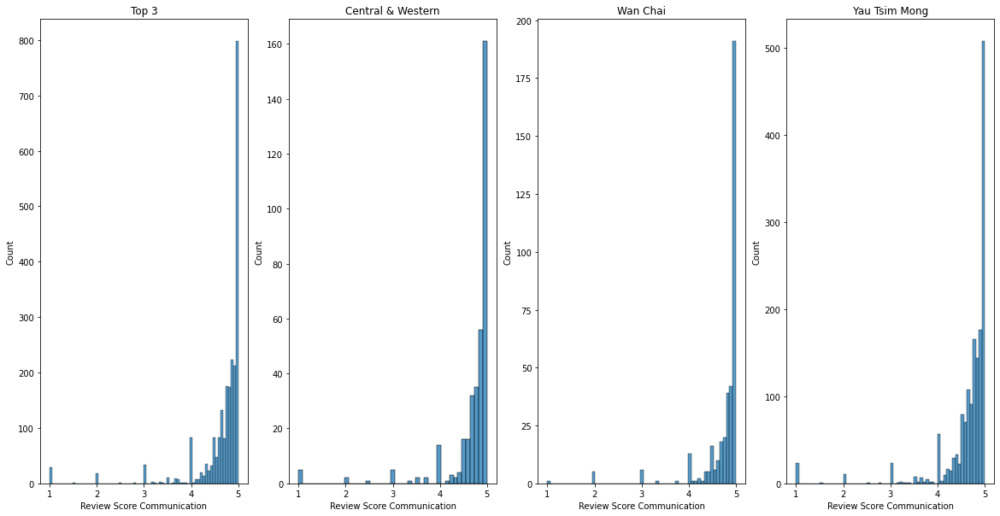

In [ ]:
# Review Score Communication Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_communication')
plt.title('Top 3')
plt.xlabel('Review Score Communication')

plt.subplot(142)
central_western = listing_gz['review_scores_communication'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_communication')
plt.title('Central & Western')
plt.xlabel('Review Score Communication')

plt.subplot(143)
wan_chai = listing_gz['review_scores_communication'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_communication')
plt.title('Wan Chai')
plt.xlabel('Review Score Communication')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_communication'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_communication')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Communication')

plt.show()

###Review Score Location Distribution

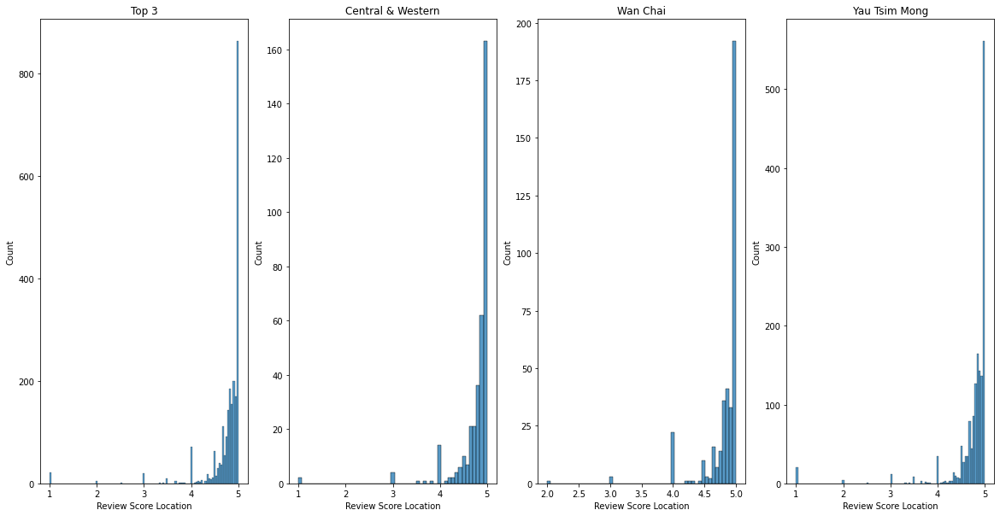

In [ ]:
# Review Score Location Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_location')
plt.title('Top 3')
plt.xlabel('Review Score Location')

plt.subplot(142)
central_western = listing_gz['review_scores_location'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_location')
plt.title('Central & Western')
plt.xlabel('Review Score Location')

plt.subplot(143)
wan_chai = listing_gz['review_scores_location'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_location')
plt.title('Wan Chai')
plt.xlabel('Review Score Location')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_location'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_location')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Location')

plt.show()

### Review Score Value Distribution

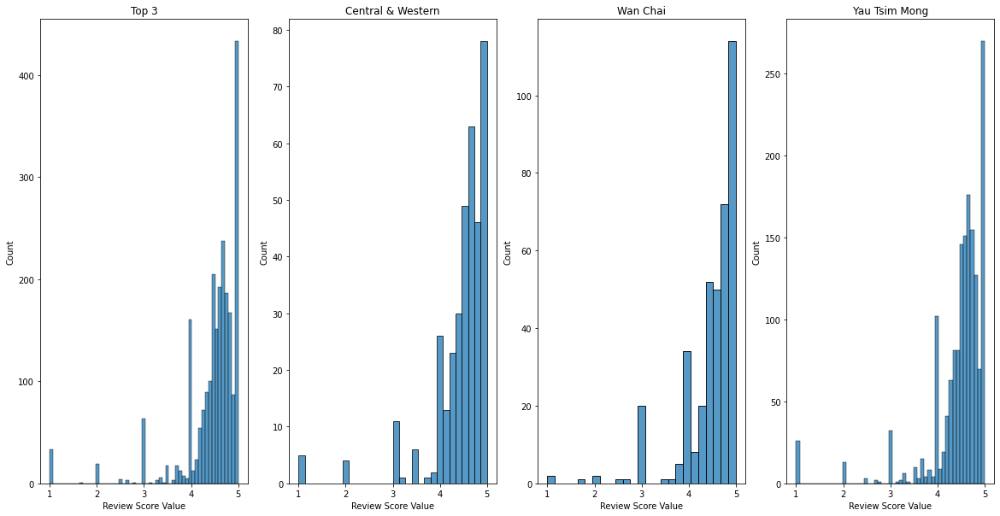

In [ ]:
# Review Score Value Distribution
plt.figure(figsize=(20,10))

plt.subplot(141)
sns.histplot(data=listing_gz, x='review_scores_value')
plt.title('Top 3')
plt.xlabel('Review Score Value')

plt.subplot(142)
central_western = listing_gz['review_scores_value'][listing_gz['neighbourhood_cleansed']=='Central & Western'].reset_index()
sns.histplot(data=central_western, x='review_scores_value')
plt.title('Central & Western')
plt.xlabel('Review Score Value')

plt.subplot(143)
wan_chai = listing_gz['review_scores_value'][listing_gz['neighbourhood_cleansed']=='Wan Chai'].reset_index()
sns.histplot(data=wan_chai, x='review_scores_value')
plt.title('Wan Chai')
plt.xlabel('Review Score Value')

plt.subplot(144)
yau_tsim_mong = listing_gz['review_scores_value'][listing_gz['neighbourhood_cleansed']=='Yau Tsim Mong'].reset_index()
sns.histplot(data=yau_tsim_mong, x='review_scores_value')
plt.title('Yau Tsim Mong')
plt.xlabel('Review Score Value')

plt.show()

### Feedback Comparison by Review Score Value

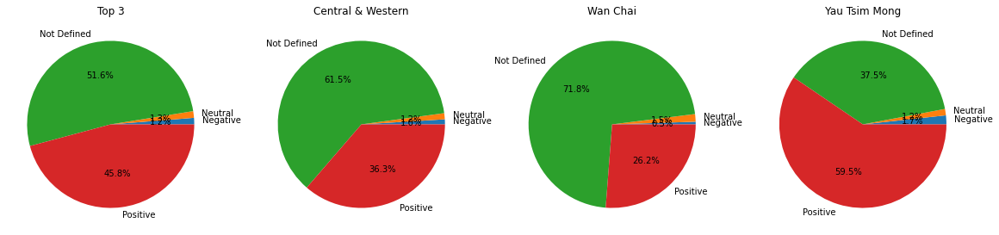

In [ ]:
# Feedback Comparison by Review Score Value
def feedback(data_df, col_name):
    value_collection = []

    for i in data_df[col_name]:
        if i < 3:
            value_collection.append('Negative')
        elif i == 3:
            value_collection.append('Neutral')
        elif i > 3:
            value_collection.append('Positive')
        else:
            value_collection.append('Not_defined')

    a = len(value_collection)

    feed_back_df = pd.DataFrame({'feed_back': value_collection, 'no_of_feed_back': value_collection, 'feedback_total': a})
    feed_back_group_by_df = feed_back_df.groupby(['feed_back', 'feedback_total'])['no_of_feed_back'].count().reset_index()
    percentage = round((feed_back_group_by_df['no_of_feed_back']/feed_back_group_by_df['feedback_total']*100), 2)
    return percentage

listing_central_western = listing_gz[listing_gz['neighbourhood_cleansed'] == 'Central & Western']
listing_wan_chai = listing_gz[listing_gz['neighbourhood_cleansed'] == 'Wan Chai']
listing_yau_tsim_mong = listing_gz[listing_gz['neighbourhood_cleansed'] == 'Yau Tsim Mong']

labels = ['Negative', 'Neutral',  'Not Defined', 'Positive']

plt.figure(figsize=(20,20))

value_collection_count_top_3 = feedback(listing_gz, 'review_scores_value')
plt.subplot(141)
plt.pie(value_collection_count_top_3, labels=labels, autopct='%1.1f%%')
plt.title(label='Top 3')

value_collection_count_central_western = feedback(listing_central_western, 'review_scores_value')
plt.subplot(142)
plt.pie(value_collection_count_central_western, labels=labels, autopct='%1.1f%%')
plt.title(label='Central & Western')

value_collection_count_wan_chai = feedback(listing_wan_chai, 'review_scores_value')
plt.subplot(143)
plt.pie(value_collection_count_wan_chai, labels=labels, autopct='%1.1f%%')
plt.title(label='Wan Chai')

value_collection_count_yau_tsim_mong = feedback(listing_yau_tsim_mong, 'review_scores_value')
plt.subplot(144)
plt.pie(value_collection_count_yau_tsim_mong, labels=labels, autopct='%1.1f%%')
plt.title(label='Yau Tsim Mong')

plt.show()

##  Map Drawing

### By Rating & No of Reviews

In [ ]:
def rating(star,no_of_review):
  rating = listing_gz[(listing_gz['review_scores_rating']>=star) & (listing_gz['number_of_reviews']>=no_of_review)]
  return draw_map(rating)

In [ ]:
rating(4.5,100)

### By Number of Beds/Number of Bedrooms

In [ ]:
def bedroom(no_of_bed,no_of_bedrood = 1):
  bedroom = listing_gz[(listing_gz['beds']>=no_of_bed) & (listing_gz['bedrooms']>=no_of_bedrood)]
  return draw_map(bedroom)

In [ ]:
bedroom(2)

Output hidden; open in https://colab.research.google.com to view.

### Find Location

In [ ]:
def Find_location():
    lst_room_type = {'A': 'Entire home/apt','B':'Hotel room','C': 'Private room','D': 'Shared room'}

    rate          = float(input('Average Rating\n'))
    review_count  = int(input('Number of Reviews\n'))
    acco          = int(input('Number of people\n'))
    beds          = int(input('Number of beds\n'))
    room_type     = input('''Room type:\n
                    A: Entire home/apt
                    B: Hotel room
                    C: Private room
                    D: Shared room\n''')
    price         = float(input("Price lower than:\n"))

    map        = listing_gz[(listing_gz['review_scores_rating']>=rate) & 
                               (listing_gz['number_of_reviews']>=review_count) &
                               (listing_gz['accommodates']>=acco) &
                               (listing_gz['beds']>=beds) &
                               (listing_gz['room_type']==lst_room_type[room_type]) &
                               (listing_gz['price']<=price)]

    return draw_map(map)

In [ ]:
Find_location()

Average Rating
4.5
Number of Reviews
50
Number of people
2
Number of beds
1
Room type:

                    A: Entire home/apt
                    B: Hotel room
                    C: Private room
                    D: Shared room
A
Price lower than:
1000
